DenseNet121# <b>1 <span style='color:#4285f4'>|</span> Importing libraries</b>
- **For ML Models**: Tensorflow, keras
- **For Data Manipulation**: numpy, pandas, sklearn
- **For Data Visualization**: matplotlib, seaborn

# **DenseNet121**

hello
hello
Original Image Shape: (231, 218, 3)
Grayscale Image Shape: (231, 218)


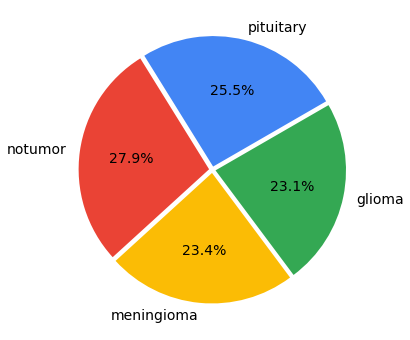

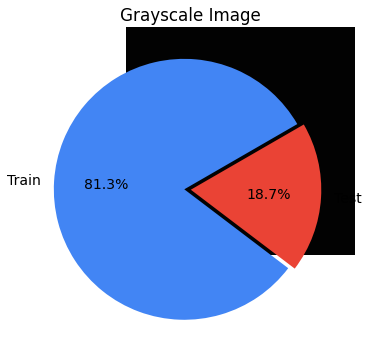

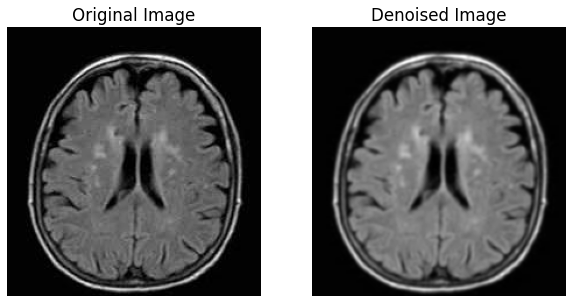

hello


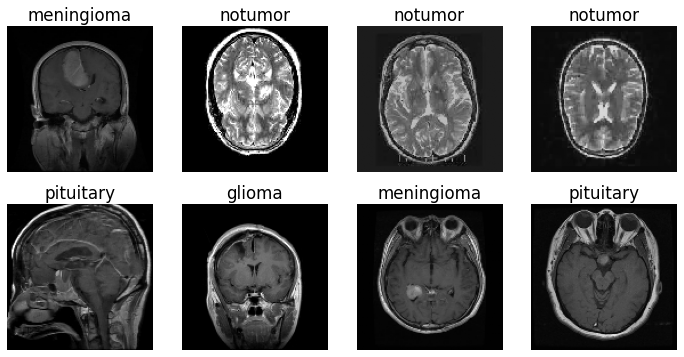

29089792/29084464 [==============================] - 1s 0us/step
hello
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
densenet121 (Functional)     (None, 4, 4, 1024)        7037504   
_________________________________________________________________
flatten (Flatten)            (None, 16384)             0         
_________________________________________________________________
dropout (Dropout)            (None, 16384)             0         
_________________________________________________________________
dense (Dense)                (None, 128)               2097280   
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 4)                 516       
Total params: 9,135,300
Trainable params: 2,136,708

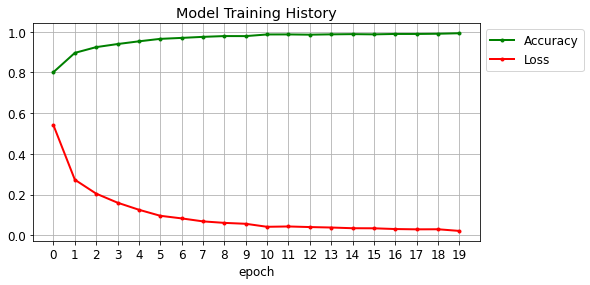

41it [00:15,  2.72it/s]                        


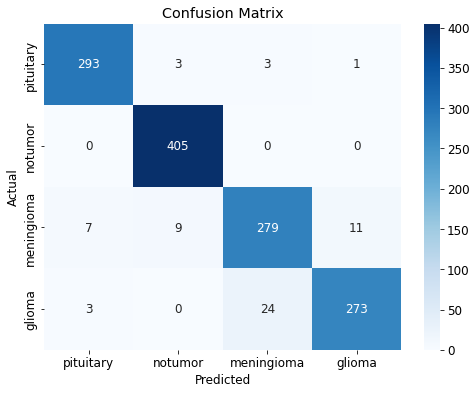

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       300
           1       0.97      1.00      0.99       405
           2       0.91      0.91      0.91       306
           3       0.96      0.91      0.93       300

    accuracy                           0.95      1311
   macro avg       0.95      0.95      0.95      1311
weighted avg       0.95      0.95      0.95      1311



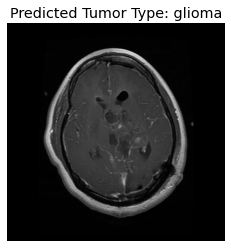

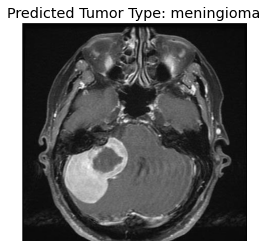

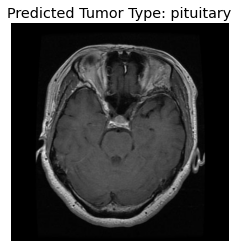

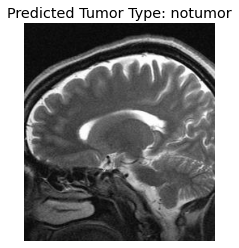

In [1]:
# For Data Processing
import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from PIL import Image, ImageEnhance

# For ML Models
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.losses import *
from tensorflow.keras.models import *
from tensorflow.keras.metrics import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.preprocessing.image import load_img

# For Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Miscellaneous
from tqdm import tqdm
import os
import random

print("hello")

# <b>2 <span style='color:#4285f4'>|</span> Reading the Dataset</b>

train_dir = '/kaggle/input/brain-tumor-mri-dataset/Training/'
test_dir = '/kaggle/input/brain-tumor-mri-dataset/Testing/'

train_paths = []
train_labels = []

for label in os.listdir(train_dir):
    for image in os.listdir(train_dir+label):
        train_paths.append(train_dir+label+'/'+image)
        train_labels.append(label)

train_paths, train_labels = shuffle(train_paths, train_labels)

print("hello")

plt.figure(figsize=(14,6))
colors = ['#4285f4', '#ea4335', '#fbbc05', '#34a853']
plt.rcParams.update({'font.size': 14})
plt.pie([len([x for x in train_labels if x=='pituitary']),
         len([x for x in train_labels if x=='notumor']),
         len([x for x in train_labels if x=='meningioma']),
         len([x for x in train_labels if x=='glioma'])],
        labels=['pituitary','notumor', 'meningioma', 'glioma'],
        colors=colors, autopct='%.1f%%', explode=(0.025,0.025,0.025,0.025),
        startangle=30);

#### The dataset is reasonably balanced

test_paths = []
test_labels = []

for label in os.listdir(test_dir):
    for image in os.listdir(test_dir+label):
        test_paths.append(test_dir+label+'/'+image)
        test_labels.append(label)

test_paths, test_labels = shuffle(test_paths, test_labels)

plt.figure(figsize=(14,6))
colors = ['#4285f4', '#ea4335', '#fbbc05', '#34a853']
plt.rcParams.update({'font.size': 14})
plt.pie([len(train_labels), len(test_labels)],
        labels=['Train','Test'],
        colors=colors, autopct='%.1f%%', explode=(0.05,0),
        startangle=30);

#grayscale

# Grayscale conversion function
def convert_to_grayscale(image_path):
    img = Image.open(image_path).convert('L')  # 'L' mode for grayscale
    return np.array(img)

# Example of how to use the grayscale conversion function
image_path = train_paths[0]
grayscale_image = convert_to_grayscale(image_path)

# Print the shape of the grayscale image array
print(f"Original Image Shape: {np.array(Image.open(image_path)).shape}")
print(f"Grayscale Image Shape: {grayscale_image.shape}")

plt.imshow(grayscale_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')  # Turn off axis labels
plt.show()



import os
import numpy as np
from PIL import Image
from sklearn.utils import shuffle
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

def denoise_image(image, sigma=1.0):
    return gaussian_filter(image, sigma=sigma)

# Example of how to use the denoising function
image_path = train_paths[0]
grayscale_image = convert_to_grayscale(image_path)

# Denoise the image
denoised_image = denoise_image(grayscale_image, sigma=1.0)

# Display the original and denoised images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(grayscale_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(denoised_image, cmap='gray')
plt.title('Denoised Image')
plt.axis('off')

plt.show()

# <b>3 <span style='color:#4285f4'>|</span> Data Augmentation</b>
#- Random Brightness: 80% - 120%  
#- Random Contrast: 80% - 120%


def augment_image(image):
    image = Image.fromarray(np.uint8(image))
    image = ImageEnhance.Brightness(image).enhance(random.uniform(0.8,1.2))
    image = ImageEnhance.Contrast(image).enhance(random.uniform(0.8,1.2))
    image = np.array(image)/255.0
    return image

print("hello")

IMAGE_SIZE=128

def open_images(paths):

    # Given a list of paths to images, this function returns the images as arrays (after augmenting them)

    images = []
    for path in paths:
        image = load_img(path, target_size=(IMAGE_SIZE,IMAGE_SIZE))
        image = augment_image(image)
        images.append(image)
    return np.array(images)

images = open_images(train_paths[50:59])
labels = train_labels[50:59]
fig = plt.figure(figsize=(12, 6))
for x in range(1, 9):
    fig.add_subplot(2, 4, x)
    plt.axis('off')
    plt.title(labels[x])
    plt.imshow(images[x])
plt.rcParams.update({'font.size': 12})
plt.show()

# <b>4 <span style='color:#4285f4'>|</span> Data Generator</b>


unique_labels = os.listdir(train_dir)

def encode_label(labels):
    encoded = []
    for x in labels:
        encoded.append(unique_labels.index(x))
    return np.array(encoded)

def decode_label(labels):
    decoded = []
    for x in labels:
        decoded.append(unique_labels[x])
    return np.array(decoded)

def datagen(paths, labels, batch_size=12, epochs=1):
    for _ in range(epochs):
        for x in range(0, len(paths), batch_size):
            batch_paths = paths[x:x+batch_size]
            batch_images = open_images(batch_paths)
            batch_labels = labels[x:x+batch_size]
            batch_labels = encode_label(batch_labels)
            yield batch_images, batch_labels

# <b>5 <span style='color:#4285f4'>|</span> Model</b>

### I am using **VGG16** for transfer learning

from tensorflow.keras.applications import DenseNet121
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Input, Flatten, Dropout, Dense


base_model = DenseNet121(input_shape=(IMAGE_SIZE,IMAGE_SIZE,3), include_top=False, weights='imagenet')
# Set all layers to non-trainable
for layer in base_model.layers[:-4]:
    layer.trainable = False
# Set the last vgg block to trainable
base_model.layers[-2].trainable = True
base_model.layers[-3].trainable = True
base_model.layers[-4].trainable = True

model = Sequential()
model.add(Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
model.add(base_model)
model.add(Flatten())
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(len(unique_labels), activation='softmax'))

print("hello")

model.summary()

keras.utils.plot_model(model, show_shapes=True)

# <b>6 <span style='color:#4285f4'>|</span> Train Model</b>

model.compile(optimizer=Adam(learning_rate=0.0001),
             loss='sparse_categorical_crossentropy',
             metrics=['sparse_categorical_accuracy'])

batch_size = 20
steps = int(len(train_paths)/batch_size)
epochs = 20
history = model.fit(datagen(train_paths, train_labels, batch_size=batch_size, epochs=epochs),
                    epochs=epochs, steps_per_epoch=steps)

plt.figure(figsize=(8,4))
plt.grid(True)
plt.plot(history.history['sparse_categorical_accuracy'], '.g-', linewidth=2)
plt.plot(history.history['loss'], '.r-', linewidth=2)
plt.title('Model Training History')
plt.xlabel('epoch')
plt.xticks([x for x in range(epochs)])
plt.legend(['Accuracy', 'Loss'], loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# <b>7 <span style='color:#4285f4'>|</span> Evaluate Model with Test Samples</b>

batch_size = 32
steps = int(len(test_paths)/batch_size)
y_pred = []
y_true = []
for x,y in tqdm(datagen(test_paths, test_labels, batch_size=batch_size, epochs=1), total=steps):
    pred = model.predict(x)
    pred = np.argmax(pred, axis=-1)
    for i in decode_label(pred):
        y_pred.append(i)
    for i in decode_label(y):
        y_true.append(i)

from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Function to decode one-hot encoded labels
def decode_label(labels):
    decoded = []
    for x in labels:
        decoded.append(unique_labels[x])
    return np.array(decoded)

# Generate predictions on the test set
test_predictions = model.predict(datagen(test_paths, test_labels, batch_size=batch_size, epochs=1))
test_predictions = np.argmax(test_predictions, axis=-1)

# Decode one-hot encoded labels
y_true = encode_label(test_labels)
y_pred = test_predictions

# Create confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


print(classification_report(y_true, y_pred))

# Import necessary libraries
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the path to the test image
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0051.jpg'  # Replace this with the actual path

# Load and preprocess the test image
test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
test_img_array = image.img_to_array(test_img)
test_img_array = np.expand_dims(test_img_array, axis=0)
test_img_array = preprocess_input(test_img_array)

# Make predictions
predictions = model.predict(test_img_array)
predicted_class = np.argmax(predictions[0])
predicted_label = decode_label([predicted_class])[0]

# Display the test image
img = mpimg.imread(test_image_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.title("Predicted Tumor Type: " + predicted_label)
plt.show()

# Import necessary libraries
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the path to the test image
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0013.jpg'  # Replace this with the actual path

# Load and preprocess the test image
test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
test_img_array = image.img_to_array(test_img)
test_img_array = np.expand_dims(test_img_array, axis=0)
test_img_array = preprocess_input(test_img_array)

# Make predictions
predictions = model.predict(test_img_array)
predicted_class = np.argmax(predictions[0])
predicted_label = decode_label([predicted_class])[0]

# Display the test image
img = mpimg.imread(test_image_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.title("Predicted Tumor Type: " + predicted_label)
plt.show()

# Import necessary libraries
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the path to the test image
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0023.jpg'  # Replace this with the actual path

# Load and preprocess the test image
test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
test_img_array = image.img_to_array(test_img)
test_img_array = np.expand_dims(test_img_array, axis=0)
test_img_array = preprocess_input(test_img_array)

# Make predictions
predictions = model.predict(test_img_array)
predicted_class = np.argmax(predictions[0])
predicted_label = decode_label([predicted_class])[0]

# Display the test image
img = mpimg.imread(test_image_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.title("Predicted Tumor Type: " + predicted_label)
plt.show()

# Import necessary libraries
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.densenet import preprocess_input
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the path to the test image
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0013.jpg'  # Replace this with the actual path

# Load and preprocess the test image
test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
test_img_array = image.img_to_array(test_img)
test_img_array = np.expand_dims(test_img_array, axis=0)
test_img_array = preprocess_input(test_img_array)

# Make predictions
predictions = model.predict(test_img_array)
predicted_class = np.argmax(predictions[0])
predicted_label = decode_label([predicted_class])[0]

# Display the test image
img = mpimg.imread(test_image_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.title("Predicted Tumor Type: " + predicted_label)
plt.show()

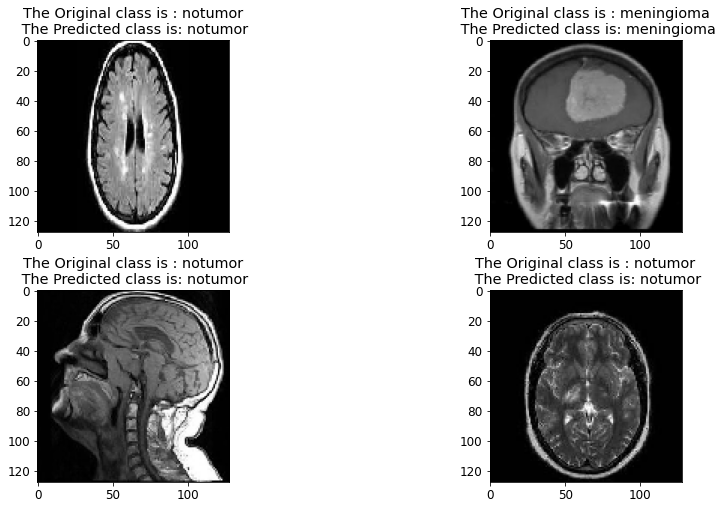

In [2]:
# Prediction using VGG16 model
plt.figure(figsize=(15, 12))
for i in range(4):
    plt.subplot(3, 2, (i % 12) + 1)
    index = np.random.randint(len(test_paths))
    test_image_path = test_paths[index]  # Get the test image path
    test_label = test_labels[index]  # Get the original label

    # Load and preprocess the test image
    test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    test_img_array = image.img_to_array(test_img)
    test_img_array = np.expand_dims(test_img_array, axis=0)
    test_img_array = preprocess_input(test_img_array)

    # Make predictions
    predictions = model.predict(test_img_array)
    predicted_class = np.argmax(predictions[0])
    predicted_label = decode_label([predicted_class])[0]

    # Display the test image on a graph
    plt.imshow(test_img)
    plt.title("The Original class is : {}\n The Predicted class is: {}".format(test_label, predicted_label))
    plt.axis('on')
    plt.grid(False)

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.1, hspace=0.3)
plt.show()


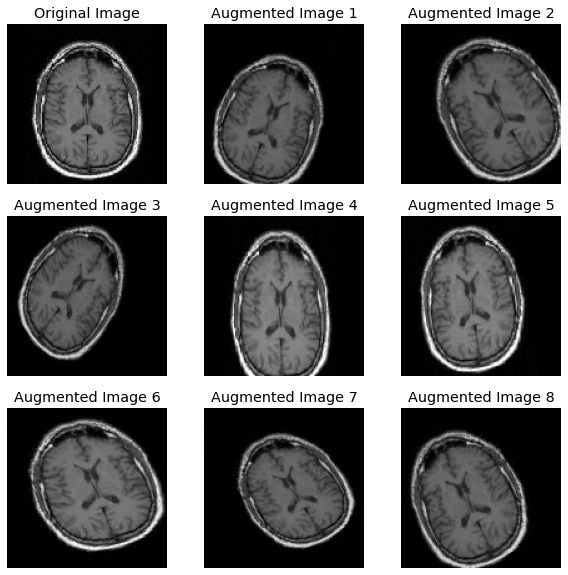

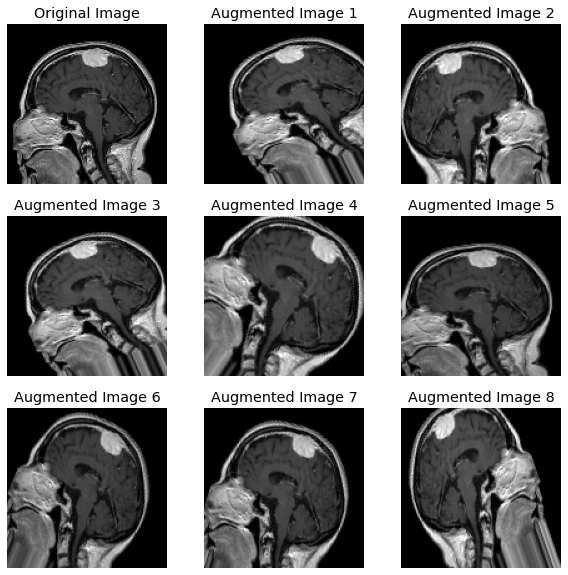

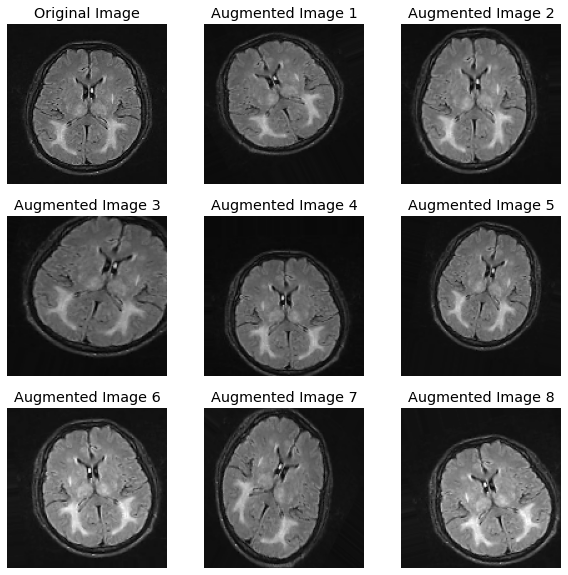

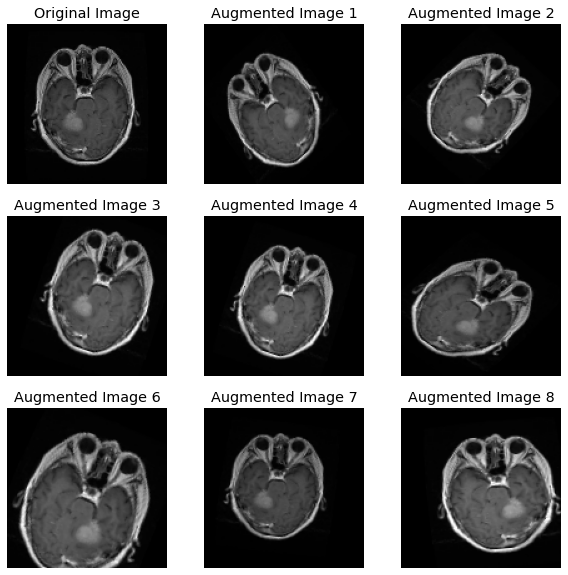

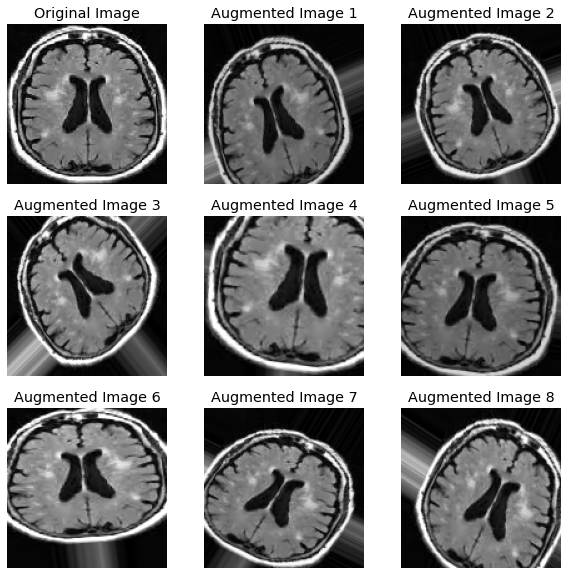

...

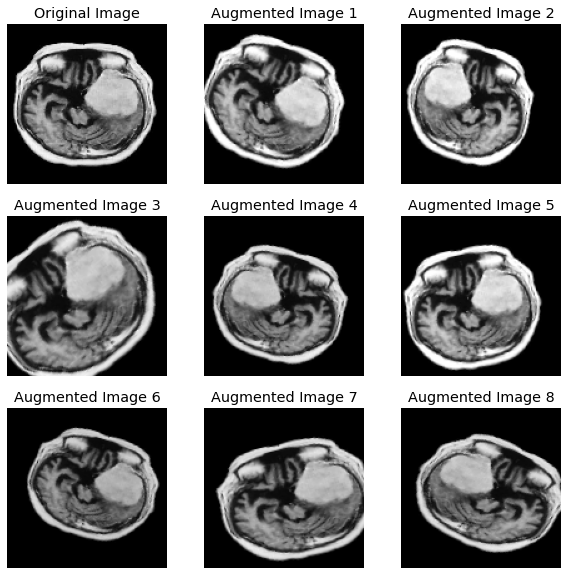

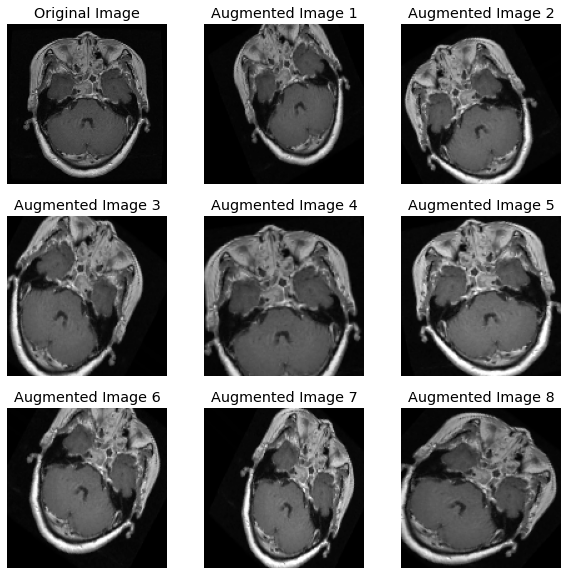

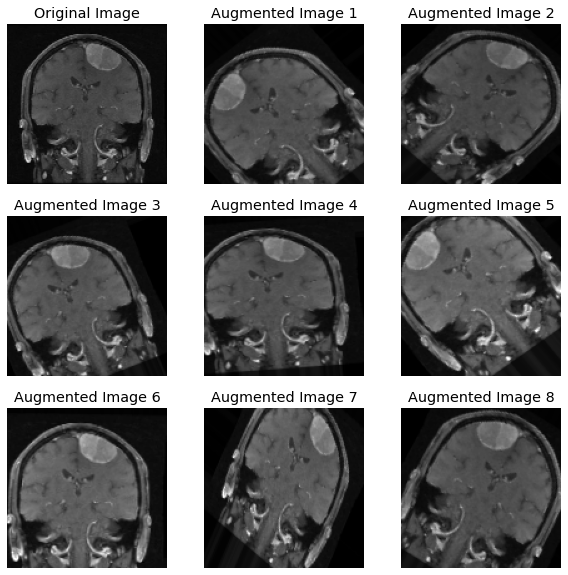

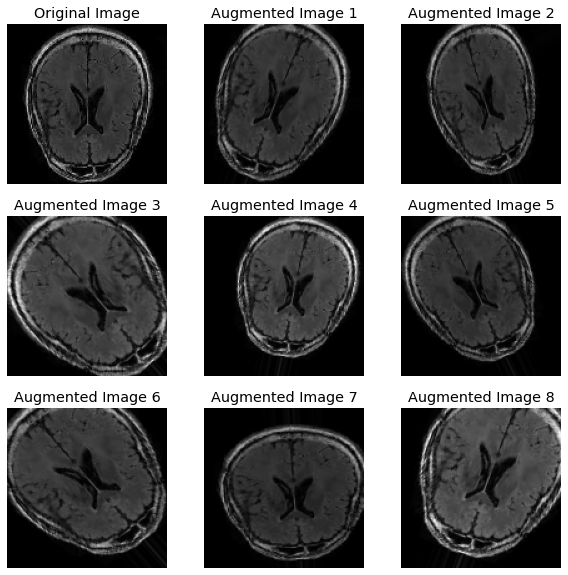

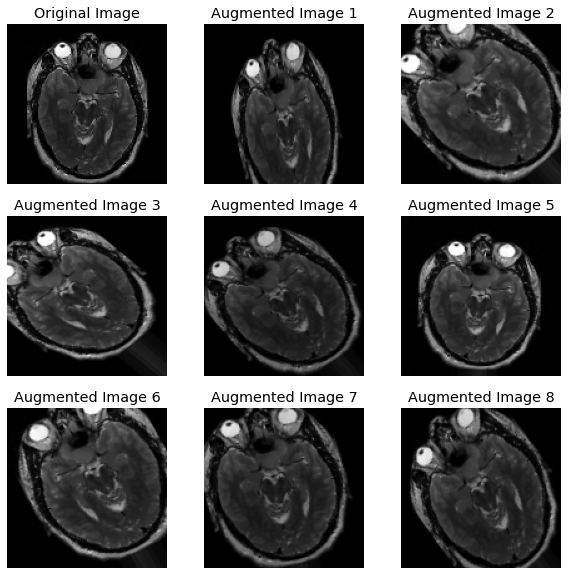

ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type NoneType).

In [9]:
# Create a data generator for evaluation on the test set
def test_datagen(paths, labels, batch_size=32):
    while True:
        for start in range(0, len(paths), batch_size):
            end = min(start + batch_size, len(paths))
            batch_paths = paths[start:end]
            batch_images = open_images(batch_paths)
            batch_labels = labels[start:end]
            batch_labels = encode_label(batch_labels)
            yield batch_images, batch_labels

# Evaluate model on test set
test_loss, test_accuracy = model.evaluate(test_datagen(test_paths, test_labels, batch_size=batch_size),
                                           steps=len(test_paths) // batch_size)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Plot testing accuracy and loss
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['sparse_categorical_accuracy'], color='blue', label='Training Accuracy')
plt.axhline(y=test_accuracy, color='red', linestyle='--', label='Test Accuracy')
plt.title('Training vs Testing Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], color='green', label='Training Loss')
plt.axhline(y=test_loss, color='orange', linestyle='--', label='Test Loss')
plt.title('Training vs Testing Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


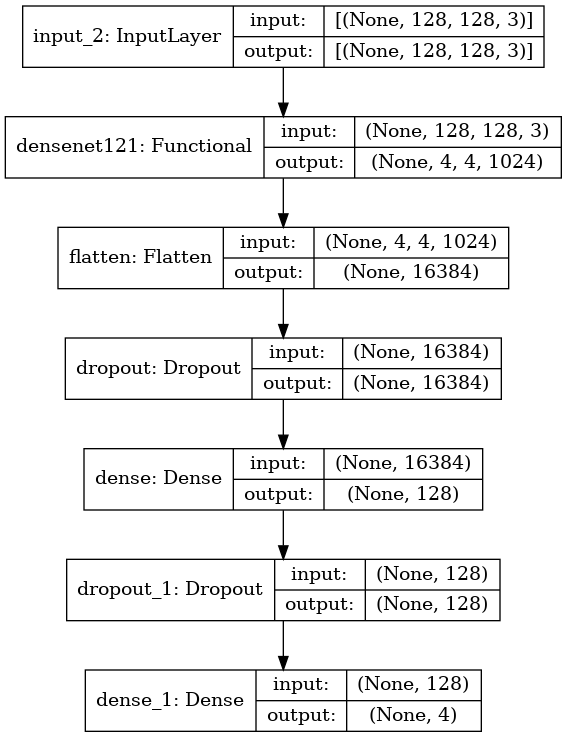

In [16]:

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_vgg_plot.png', show_shapes=True, show_layer_names=True)

plot_model(model, to_file='model_vgg_plot.png', show_shapes=True, show_layer_names=True)
model
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='/kaggle/working/model_vgg_plot.png', show_shapes=True, show_layer_names=True)


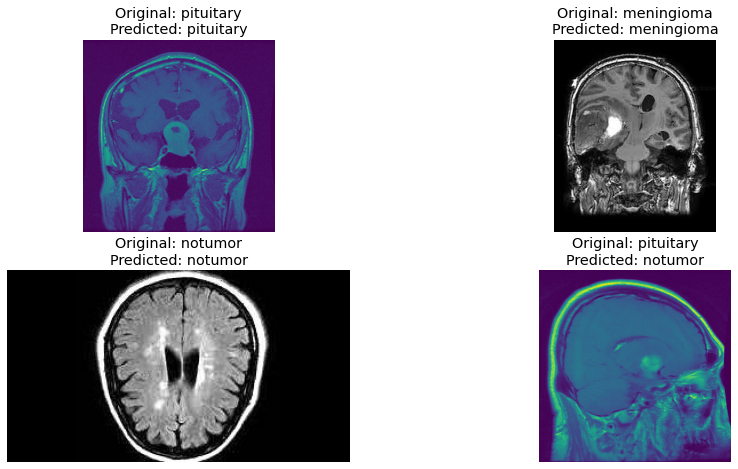

In [3]:
# Prediction using VGG16 model
plt.figure(figsize=(15, 12))
for i in range(4):
    plt.subplot(3, 2, (i % 12) + 1)
    index = np.random.randint(len(test_paths))
    test_image_path = test_paths[index]  # Get the test image path
    test_label = test_labels[index]  # Get the original label

    # Load and preprocess the test image
    test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    test_img_array = image.img_to_array(test_img)
    test_img_array = np.expand_dims(test_img_array, axis=0)
    test_img_array = preprocess_input(test_img_array)

    # Make predictions
    predictions = model.predict(test_img_array)
    predicted_class = np.argmax(predictions[0])
    predicted_label = decode_label([predicted_class])[0]

    # Display the test image
    img = mpimg.imread(test_image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Original: {}\nPredicted: {}".format(test_label, predicted_label))
plt.show()


hello


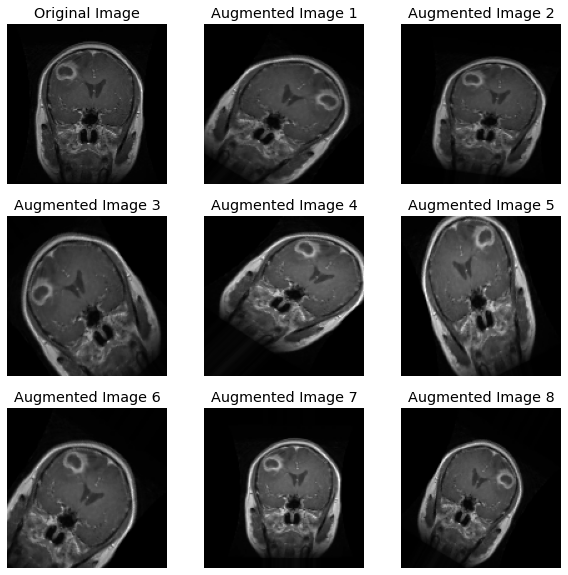

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt

# Updated augment_image function to include affine transformations
def augment_image(image):
    # Convert to PIL Image
    image_pil = Image.fromarray(np.uint8(image))
    original_image = np.array(image_pil)
    plt.figure(figsize=(10, 10))
    plt.subplot(3, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')
    
    # Create an ImageDataGenerator instance for augmentation
    datagen = ImageDataGenerator(
        brightness_range=[0.8, 1.2],  # Random brightness
        rotation_range=45,  # Rotation range (-45 to 45 degrees)
        width_shift_range=0.1,  # Horizontal shift
        height_shift_range=0.1,  # Vertical shift
        shear_range=0.2,  # Shear transformation
        zoom_range=0.2,  # Zoom transformation
        horizontal_flip=True,  # Horizontal flip
        fill_mode='nearest'  # Fill mode for points outside input boundaries
    )
    
    # Convert image to numpy array
    image = np.expand_dims(original_image, axis=0)
    
    # Generate augmented images
    augmented_images = datagen.flow(image, batch_size=1)
    
    # Display images after each augmentation technique
    for i in range(2, 10):
        augmented_image = augmented_images.next()[0]
        plt.subplot(3, 3, i)
        plt.imshow(augmented_image.astype('uint8'))
        plt.title(f'Augmented Image {i-1}')
        plt.axis('off')
    
    plt.show()

print("hello")

# Define the directory containing images
directory = '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/'

# List image files in the directory
image_files = [os.path.join(directory, f) for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

# Choose a specific image file
image_path = image_files[0]

# Load the image
image = load_img(image_path, target_size=(128, 128))

# Visualize augmented images
augment_image(image)


In [5]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_cnn_plot.png', show_shapes=True, show_layer_names=True)

ModuleNotFoundError: No module named 'keras'

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Function to apply histogram equalization to the image
def apply_histogram_equalization(image):
    # Convert image to grayscale if it's not already
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Apply histogram equalization
    equalized = cv2.equalizeHist(gray)
    
    return equalized

# Load MRI brain tumor image
image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-glTr_0000.jpg"
image = cv2.imread(image_path)

# Apply histogram equalization
augmented_image = apply_histogram_equalization(image)

# Plot original and augmented images
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

plt.subplot(1, 2, 2)
plt.title('Augmented Image')
plt.imshow(augmented_image, cmap='gray')

plt.show()


# **DATA AUGUMENTATION USING ANTS**

In [ ]:
!pip install ants

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import SimpleITK as sitk
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_image(image):
    # Convert to grayscale
    original_image_gray = image.convert('L')
    
    # Convert to numpy array
    original_image_np = np.array(original_image_gray)
    
    # Convert to 32-bit float
    original_image_float = original_image_np.astype(np.float32)
    
    # Convert to SimpleITK image
    original_sitk = sitk.GetImageFromArray(original_image_float)
    
    # Perform registration
    registration_method = sitk.ImageRegistrationMethod()
    registration_method.SetMetricAsMattesMutualInformation(numberOfHistogramBins=50)
    registration_method.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=100)
    registration_method.SetInterpolator(sitk.sitkLinear)

    # Create a transform
    transform = sitk.TranslationTransform(original_sitk.GetDimension())

    # Set the transform
    registration_method.SetInitialTransform(transform)

    # Convert images to SimpleITK format
    flipped_image_np = np.flip(original_image_float, axis=1)
    flipped_sitk = sitk.GetImageFromArray(flipped_image_np)

    # Perform registration
    final_transform = registration_method.Execute(original_sitk, flipped_sitk)
    registered_sitk = sitk.Resample(flipped_sitk, original_sitk, final_transform)
    registered_image = sitk.GetArrayFromImage(registered_sitk)

    # Apply flipping augmentation (Using Keras ImageDataGenerator)
    datagen = ImageDataGenerator(horizontal_flip=True)
    flipped_image = datagen.random_transform(registered_image)

    # Display augmented images
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image_float, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(registered_image, cmap='gray')
    plt.title('Registered Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(flipped_image, cmap='gray')
    plt.title('Flipped Image')
    plt.axis('off')

    plt.show()

# Path to the image you want to augment
image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-glTr_0004.jpg"

# Load the image
image = Image.open(image_path)

# Visualize augmented images
augment_image(image)


In [ ]:
from PIL import Image
import numpy as np

def remove_skull_border(original_image_path, output_image_path, threshold=150):
    # Load original image
    original_image = Image.open(original_image_path)

    # Convert image to numpy array
    original_array = np.array(original_image)

    # Apply intensity thresholding to identify skull region
    skull_mask = original_array[:, :, 0] < threshold  # Assuming skull regions have lower intensity

    # Invert the mask to keep the brain region
    brain_mask = ~skull_mask

    # Apply the brain mask to the original image
    brain_only_image = np.array(original_image)
    brain_only_image[skull_mask] = [1, 1, 1]  # Set skull region to black

    # Convert numpy array back to PIL Image
    brain_only_image = Image.fromarray(brain_only_image)

    # Save the image with skull border removed
    brain_only_image.save(output_image_path)

# Example usage
original_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0023.jpg'
output_image_path = '/kaggle/working/brain_only.jpg'
remove_skull_border(original_image_path, output_image_path, threshold=150)

# Load the saved output image
output_image = Image.open(output_image_path)

# Display the output image
plt.imshow(output_image)
plt.axis('off')
plt.show()


# **Lesion Segmentation**

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Function to perform lesion segmentation
def segment_lesion(image_path, output_path):
    # Read the image
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Apply Gaussian blur to smooth the image
    blurred = cv2.GaussianBlur(image, (5, 5), 0)
    
    # Thresholding to segment the lesion
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Perform morphological operations (erosion and dilation) to remove noise
    kernel = np.ones((5, 5), np.uint8)
    opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
    closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=3)
    
    # Find contours of the lesion
    contours, _ = cv2.findContours(closing, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Draw contours on the original image
    segmented_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(segmented_image, contours, -1, (0, 255, 0), 2)
    
    # Save the segmented image
    cv2.imwrite(output_path, segmented_image)

# Example usage
image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-meTr_0004.jpg"
output_path = "/kaggle/working/segmented_image.jpg"
segment_lesion(image_path, output_path)
segment_image = Image.open(output_path)

# Display the output image
plt.imshow(segment_image)
plt.axis('off')
plt.show()



In [ ]:
pip install opencv-contrib-python --upgrade


In [ ]:
# Necessary imports
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Flatten, Dropout, Dense
from tensorflow.keras.preprocessing import image

# Define Grad-CAM functions
def get_img_array(img_path, size):
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    array = keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    heatmap = last_conv_layer_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    superimposed_img.save(cam_path)
    display(Image(cam_path))

# Load the DenseNet121 model
base_model = DenseNet121(input_shape=(128, 128, 3), include_top=False, weights='imagenet')
model = Sequential()
model.add(Input(shape=(128, 128, 3)))
model.add(base_model)
model.add(Flatten())
model.add(Dropout(0.3))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(4, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Load and preprocess the test image
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0051.jpg'
test_img = image.load_img(test_image_path, target_size=(128, 128))
test_img_array = image.img_to_array(test_img)
test_img_array = np.expand_dims(test_img_array, axis=0)
test_img_array = preprocess_input(test_img_array)

# Make predictions
predictions = model.predict(test_img_array)
predicted_class = np.argmax(predictions[0])

In [ ]:
# Generate Grad-CAM heatmap
heatmap = make_gradcam_heatmap(test_img_array, model, 'conv5_block16_concat')


# Display Grad-CAM
save_and_display_gradcam(test_image_path, heatmap)

In [ ]:

heatmap = make_gradcam_heatmap(test_img_array, model, 'conv5_block16_2_conv')


In [30]:
# Import VGG16
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Initialize VGG16 base model
base_model = VGG16(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), include_top=False, weights='imagenet')

# Freeze the convolutional base
base_model.trainable = False

# Create a new model on top of the pre-trained base model
vgg_model = Sequential([
    base_model,
    Flatten(),
    Dropout(0.3),
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(len(unique_labels), activation='softmax')
])

# Compile the model
vgg_model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['sparse_categorical_accuracy'])

# Print model summary
vgg_model.summary()


Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_4 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 8192)              0         
_________________________________________________________________
dense_8 (Dense)              (None, 128)               1048704   
_________________________________________________________________
dropout_9 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 4)                 516       
Total params: 15,763,908
Trainable params: 1,049,220
Non-trainable params: 14,714,688
__________________________________

In [31]:
# Modify the batch size
batch_size = 32  # Experiment with different values (e.g., 8, 32, 64)

# Modify the learning rate
learning_rate = 0.001  # Experiment with different values (e.g., 0.001, 0.00001)

# Modify data augmentation factors
brightness_range = (0.9, 1.1)  # Adjust the range for brightness augmentation
contrast_range = (0.9, 1.1)  # Adjust the range for contrast augmentation

# Update the augment_image function
def augment_image(image):
    image = Image.fromarray(np.uint8(image))
    image = ImageEnhance.Brightness(image).enhance(random.uniform(*brightness_range))
    image = ImageEnhance.Contrast(image).enhance(random.uniform(*contrast_range))
    image = np.array(image) / 255.0
    return image

# Update the model compilation with the new learning rate
vgg_model.compile(optimizer=Adam(learning_rate=learning_rate),
             loss='sparse_categorical_crossentropy',
             metrics=['sparse_categorical_accuracy'])

# Train the model with the updated parameters
history = vgg_model.fit(datagen(train_paths, train_labels, batch_size=batch_size, epochs=epochs),
                    epochs=epochs, steps_per_epoch=steps)


Epoch 1/20
40/40 [==============================] - 5s 115ms/step - loss: 1.1852 - sparse_categorical_accuracy: 0.5327
Epoch 2/20
40/40 [==============================] - 5s 114ms/step - loss: 0.4773 - sparse_categorical_accuracy: 0.8277
Epoch 3/20
40/40 [==============================] - 5s 113ms/step - loss: 0.4098 - sparse_categorical_accuracy: 0.8403
Epoch 4/20
40/40 [==============================] - 5s 121ms/step - loss: 0.4578 - sparse_categorical_accuracy: 0.8265
Epoch 5/20
40/40 [==============================] - 4s 112ms/step - loss: 0.4017 - sparse_categorical_accuracy: 0.8345
Epoch 6/20
40/40 [==============================] - 5s 121ms/step - loss: 0.3067 - sparse_categorical_accuracy: 0.8874
Epoch 7/20
40/40 [==============================] - 4s 112ms/step - loss: 0.3011 - sparse_categorical_accuracy: 0.8931
Epoch 8/20
40/40 [==============================] - 5s 114ms/step - loss: 0.3248 - sparse_categorical_accuracy: 0.8771
Epoch 9/20
40/40 [==============================

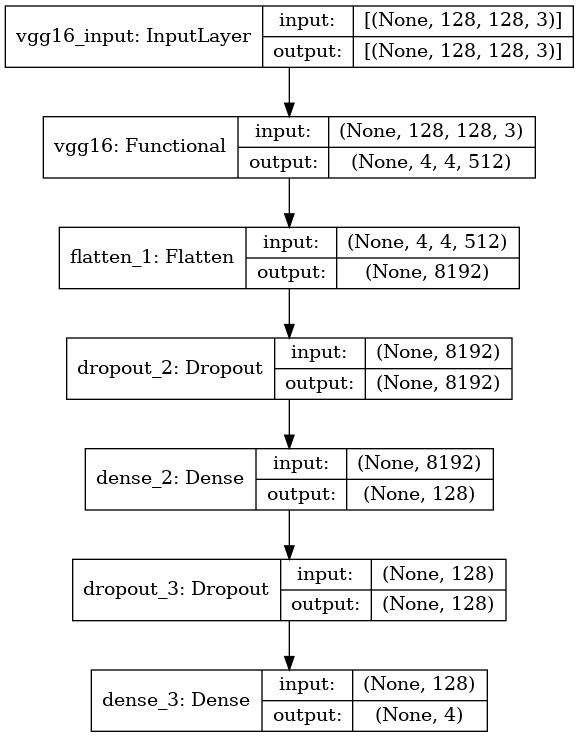

In [21]:

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_vgg_plot.png', show_shapes=True, show_layer_names=True)

plot_model(model, to_file='model_vggplot.png', show_shapes=True, show_layer_names=True)
model
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='/kaggle/working/model_vgg_plot.png', show_shapes=True, show_layer_names=True)


# **RCNN WITH RESNET**

In [ ]:
layer_name = 'dense_7'
num_classes = len(unique_labels)
compute_gradcam(model, image_path, layer_name, num_classes)


In [ ]:
import tensorflow as tf
from tensorflow import keras
from IPython.display import Image, display
import matplotlib.cm as cm

model_builder = tf.keras.applications.vgg16.VGG16
img_size = (224, 224)
preprocess_input = tf.keras.applications.vgg16.preprocess_input
decode_predictions = tf.keras.applications.vgg16.decode_predictions

last_conv_layer_name = "block5_conv3"

# The local path to our target image
img_path ="/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-meTr_0002.jpg"

display(Image(img_path))

def get_img_array(img_path, size):
    # `img` is a PIL image of size 224x224
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (224, 224, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 224, 224, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Make model
model = model_builder(weights="imagenet")

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

model_builder = tf.keras.applications.vgg16.VGG16
img_size = (224, 224)
preprocess_input = tf.keras.applications.vgg16.preprocess_input
decode_predictions = tf.keras.applications.vgg16.decode_predictions

last_conv_layer_name = "block5_conv3"

# The local path to our target image
img_path ="/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-meTr_0002.jpg"

display(Image(img_path))

def get_img_array(img_path, size):
    # `img` is a PIL image of size 224x224
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (224, 224, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 224, 224, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We iterate over each feature map in the last conv layer
    # and compute the dot product between the gradient of the class with respect
    # to the feature map, and the feature map itself
    guided_grads = []
    for i in range(len(pooled_grads)):
        guided_grads.append(tf.reduce_sum(tf.multiply(grads[0, :, :, i], last_conv_layer_output[0, :, :, i])))

    guided_grads = tf.convert_to_tensor(guided_grads)

    # We normalize the gradients
    guided_grads_norm = guided_grads / (tf.norm(guided_grads) + tf.keras.backend.epsilon())

    # We get the weights of the gradients from the conv layer
    weights = tf.reduce_mean(guided_grads_norm)

    # We get the convolutional output and compute GradCAM++
    cam = tf.reduce_sum(tf.multiply(weights, last_conv_layer_output[0]), axis=-1)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / tf.math.reduce_max(cam)  # Normalize between 0 and 1

    return cam.numpy()

# Prepare image
img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Make model
model = model_builder(weights="imagenet")

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap using GradCAM++
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.preprocessing.image.load_img(img_path)
    img = keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)


In [23]:
IMAGE_SIZE = 128  # Adjust this value according to your preference

# Import necessary libraries
import numpy as np
import cv2
from skimage.feature import greycomatrix, greycoprops, local_binary_pattern
from sklearn.preprocessing import normalize

# Function to compute GLCM and extract texture features
def compute_glcm(image):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Compute GLCM
    distances = [1]  # You can experiment with different distances and angles
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # You can experiment with different angles
    glcm = greycomatrix(gray_image, distances=distances, angles=angles, symmetric=True, normed=True)
    # Extract texture features from GLCM
    contrast = greycoprops(glcm, 'contrast').ravel()
    dissimilarity = greycoprops(glcm, 'dissimilarity').ravel()
    homogeneity = greycoprops(glcm, 'homogeneity').ravel()
    energy = greycoprops(glcm, 'energy').ravel()
    correlation = greycoprops(glcm, 'correlation').ravel()
    # Concatenate texture features
    texture_features = np.hstack([contrast, dissimilarity, homogeneity, energy, correlation])
    return texture_features

# Function to compute LBP and extract texture features
def compute_lbp(image):
    # Convert image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Compute LBP
    radius = 3  # You can experiment with different radius values
    n_points = 8 * radius
    lbp = local_binary_pattern(gray_image, n_points, radius, method='uniform')
    # Compute histogram of LBP
    hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, n_points + 3), range=(0, n_points + 2))
    # Normalize histogram
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-7)
    return hist

# Function to open and preprocess images, including GLCM and LBP for texture analysis
def open_images_with_texture_features(paths):
    images = []
    glcm_features = []
    lbp_features = []
    for path in paths:
        image = cv2.imread(path)
        # Resize image if necessary
        image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
        images.append(image)
        # Compute GLCM and extract texture features
        glcm_feature = compute_glcm(image)
        glcm_features.append(glcm_feature)
        # Compute LBP and extract texture features
        lbp_feature = compute_lbp(image)
        lbp_features.append(lbp_feature)
    return np.array(images), np.array(glcm_features), np.array(lbp_features)

# Modify the datagen function to include GLCM and LBP features
def datagen_with_texture_features(paths, labels, batch_size=12, epochs=1):
    for _ in range(epochs):
        for x in range(0, len(paths), batch_size):
            batch_paths = paths[x:x+batch_size]
            batch_images, batch_glcm_features, batch_lbp_features = open_images_with_texture_features(batch_paths)
            batch_labels = labels[x:x+batch_size]
            batch_labels = encode_label(batch_labels)
            yield [batch_images, batch_glcm_features, batch_lbp_features], batch_labels

# Modify the model to accept GLCM and LBP features as input
image_input = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
glcm_input = Input(shape=(num_glcm_features,))
lbp_input = Input(shape=(num_lbp_features,))

base_model = DenseNet121(input_tensor=image_input, weights='imagenet', include_top=False)
x = base_model.output
x = Flatten()(x)

# Add texture features as input
merged_input = concatenate([x, glcm_input, lbp_input])

x = Dense(128, activation='relu')(merged_input)
x = Dropout(0.3)(x)
output = Dense(len(unique_labels), activation='softmax')(x)

model = Model(inputs=[image_input, glcm_input, lbp_input], outputs=output)

# Compile the model

# Train the model with data generator
batch_size = 20
steps = int(len(train_paths) / batch_size)
epochs = 20
history = model.fit(datagen_with_texture_features(train_paths, train_labels, batch_size=batch_size, epochs=epochs),
                    epochs=epochs, steps_per_epoch=steps)

# Evaluate the model with test samples
batch_size = 32
steps = int(len(test_paths) / batch_size)
y_pred = []
y_true = []
for (x_images, x_glcm, x_lbp), y in tqdm(datagen_with_texture_features(test_paths, test_labels, batch_size=batch_size, epochs=1), total=steps):
    pred = model.predict([x_images, x_glcm, x_lbp])
    pred = np.argmax(pred, axis=-1)
    for i in decode_label(pred):
        y_pred.append(i)
    for i in decode_label(y):
        y_true.append(i)

# Print classification report and confusion matrix
print(classification_report(y_true, y_pred))
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


NameError: name 'num_glcm_features' is not defined

In [ ]:
save_and_display_gradcam(img_path, heatmap)

In [ ]:
from tensorflow.keras.preprocessing import image

# Load the image
img = image.load_img(image_path, target_size=(128,128))

# Convert the image to a NumPy array
img_array = image.img_to_array(img)

# Now you can access the shape attribute
image_shape = img_array.shape
height = image_shape[0]
width = image_shape[1]
channels = image_shape[2] if len(image_shape) == 3 else 1

print("Image Height:", height)
print("Image Width:", width)
print("Number of Channels:", channels)


In [22]:
import tensorflow as tf

# Load the image
image = tf.keras.preprocessing.image.load_img(image_path, target_size=(128, 128))

# Convert the image to a numpy array
image_array = tf.keras.preprocessing.image.img_to_array(image)

# Check the shape of the image array
print("Image shape:", image_array.shape)


Image shape: (128, 128, 3)


hello
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Functional)        (None, 4, 4, 2048)        23587712  
_________________________________________________________________
flatten_3 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 32768)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               4194432   
_________________________________________________________________
dropout_7 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 4)                 516       
Total params: 27,782,660
Trainable params: 5,249,668
Non-trainable params: 22,532,992
____________________________

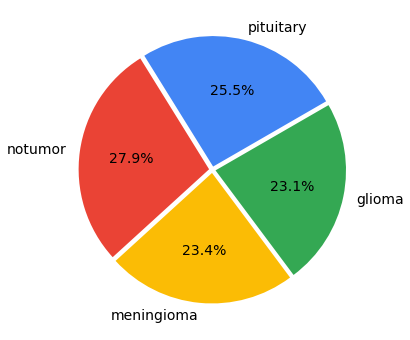

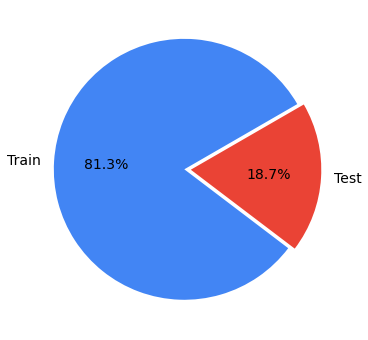

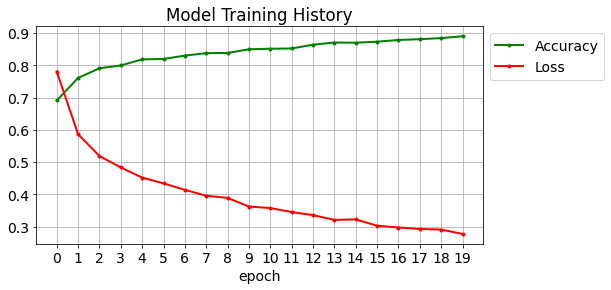

41it [00:12,  3.27it/s]                        


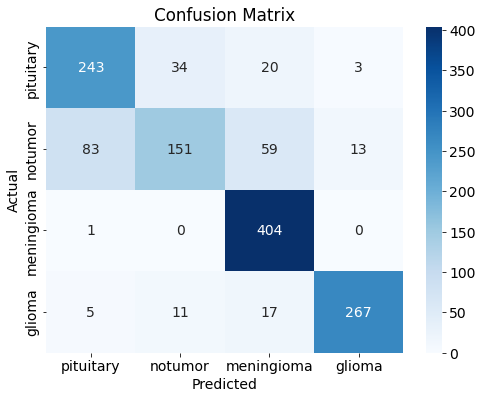

              precision    recall  f1-score   support

      glioma       0.73      0.81      0.77       300
  meningioma       0.77      0.49      0.60       306
     notumor       0.81      1.00      0.89       405
   pituitary       0.94      0.89      0.92       300

    accuracy                           0.81      1311
   macro avg       0.81      0.80      0.79      1311
weighted avg       0.81      0.81      0.80      1311



AttributeError: 'str' object has no attribute 'load_img'

In [29]:
# For Data Processing
import numpy as np
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from PIL import Image, ImageEnhance

# For ML Models
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.losses import *
from tensorflow.keras.models import *
from tensorflow.keras.metrics import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.applications import *
from tensorflow.keras.preprocessing.image import load_img

# For Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Miscellaneous
from tqdm import tqdm
import os
import random

print("hello")

# Reading the Dataset
train_dir = '/kaggle/input/brain-tumor-mri-dataset/Training/'
test_dir = '/kaggle/input/brain-tumor-mri-dataset/Testing/'

train_paths = []
train_labels = []

for label in os.listdir(train_dir):
    for image in os.listdir(train_dir+label):
        train_paths.append(train_dir+label+'/'+image)
        train_labels.append(label)

train_paths, train_labels = shuffle(train_paths, train_labels)

plt.figure(figsize=(14,6))
colors = ['#4285f4', '#ea4335', '#fbbc05', '#34a853']
plt.rcParams.update({'font.size': 14})
plt.pie([len([x for x in train_labels if x=='pituitary']),
         len([x for x in train_labels if x=='notumor']),
         len([x for x in train_labels if x=='meningioma']),
         len([x for x in train_labels if x=='glioma'])],
        labels=['pituitary','notumor', 'meningioma', 'glioma'],
        colors=colors, autopct='%.1f%%', explode=(0.025,0.025,0.025,0.025),
        startangle=30);

#### The dataset is reasonably balanced

test_paths = []
test_labels = []

for label in os.listdir(test_dir):
    for image in os.listdir(test_dir+label):
        test_paths.append(test_dir+label+'/'+image)
        test_labels.append(label)

test_paths, test_labels = shuffle(test_paths, test_labels)

plt.figure(figsize=(14,6))
colors = ['#4285f4', '#ea4335', '#fbbc05', '#34a853']
plt.rcParams.update({'font.size': 14})
plt.pie([len(train_labels), len(test_labels)],
        labels=['Train','Test'],
        colors=colors, autopct='%.1f%%', explode=(0.05,0),
        startangle=30);

# Grayscale conversion function
def convert_to_grayscale(image_path):
    img = Image.open(image_path).convert('L')  # 'L' mode for grayscale
    return np.array(img)

# Denoise image function
def denoise_image(image, sigma=1.0):
    return gaussian_filter(image, sigma=sigma)

# Data Augmentation
def augment_image(image):
    image = Image.fromarray(np.uint8(image))
    image = ImageEnhance.Brightness(image).enhance(random.uniform(0.8,1.2))
    image = ImageEnhance.Contrast(image).enhance(random.uniform(0.8,1.2))
    image = np.array(image)/255.0
    return image

IMAGE_SIZE=128

def open_images(paths):
    images = []
    for path in paths:
        image = load_img(path, target_size=(IMAGE_SIZE,IMAGE_SIZE))
        image = augment_image(image)
        images.append(image)
    return np.array(images)

# Data Generator
unique_labels = os.listdir(train_dir)

def encode_label(labels):
    encoded = []
    for x in labels:
        encoded.append(unique_labels.index(x))
    return np.array(encoded)

def decode_label(labels):
    decoded = []
    for x in labels:
        decoded.append(unique_labels[x])
    return np.array(decoded)

def datagen(paths, labels, batch_size=12, epochs=1):
    for _ in range(epochs):
        for x in range(0, len(paths), batch_size):
            batch_paths = paths[x:x+batch_size]
            batch_images = open_images(batch_paths)
            batch_labels = labels[x:x+batch_size]
            batch_labels = encode_label(batch_labels)
            yield batch_images, batch_labels

# Model
base_model = ResNet50(input_shape=(IMAGE_SIZE,IMAGE_SIZE,3), include_top=False, weights='imagenet')
for layer in base_model.layers[:-4]:
    layer.trainable = False
for layer in base_model.layers[-4:]:
    layer.trainable = True

resnetmodel = Sequential()
resnetmodel.add(Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)))
resnetmodel.add(base_model)
resnetmodel.add(Flatten())
resnetmodel.add(Dropout(0.3))
resnetmodel.add(Dense(128, activation='relu'))
resnetmodel.add(Dropout(0.2))
resnetmodel.add(Dense(len(unique_labels), activation='softmax'))

resnetmodel.summary()

keras.utils.plot_model(resnetmodel, show_shapes=True)

# Train Model
resnetmodel.compile(optimizer=Adam(learning_rate=0.0001),
             loss='sparse_categorical_crossentropy',
             metrics=['sparse_categorical_accuracy'])

batch_size = 20
steps = int(len(train_paths)/batch_size)
epochs = 20
history = resnetmodel.fit(datagen(train_paths, train_labels, batch_size=batch_size, epochs=epochs),
                    epochs=epochs, steps_per_epoch=steps)

plt.figure(figsize=(8,4))
plt.grid(True)
plt.plot(history.history['sparse_categorical_accuracy'], '.g-', linewidth=2)
plt.plot(history.history['loss'], '.r-', linewidth=2)
plt.title('Model Training History')
plt.xlabel('epoch')
plt.xticks([x for x in range(epochs)])
plt.legend(['Accuracy', 'Loss'], loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Evaluate Model with Test Samples
batch_size = 32
steps = int(len(test_paths)/batch_size)
y_pred = []
y_true = []
for x,y in tqdm(datagen(test_paths, test_labels, batch_size=batch_size, epochs=1), total=steps):
    pred = resnetmodel.predict(x)
    pred = np.argmax(pred, axis=-1)
    for i in decode_label(pred):
        y_pred.append(i)
    for i in decode_label(y):
        y_true.append(i)

# Confusion Matrix and Classification Report
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=unique_labels, yticklabels=unique_labels)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_true, y_pred))

# Prediction on Test Images
def predict_tumor_type(test_image_path):
    test_img = image.load_img(test_image_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    test_img_array = image.img_to_array(test_img)
    test_img_array = np.expand_dims(test_img_array, axis=0)
    test_img_array = preprocess_input(test_img_array)
    predictions = resnetmodel.predict(test_img_array)
    predicted_class = np.argmax(predictions[0])
    predicted_label = decode_label([predicted_class])[0]
    img = mpimg.imread(test_image_path)
    imgplot = plt.imshow(img)
    plt.axis('off')
    plt.title("Predicted Tumor Type: " + predicted_label)
    plt.show()

# Prediction on Test Images Example
test_image_path = '/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0051.jpg'
predict_tumor_type(test_image_path)


In [28]:

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_resnet.png', show_shapes=True, show_layer_names=True)

plot_model(model, to_file='model_vggplot.png', show_shapes=True, show_layer_names=True)
model
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='/kaggle/working/model_vgg_plot.png', show_shapes=True, show_layer_names=True)


NameError: name 'model3' is not defined

In [32]:
import pandas as pd

# Define function to train model and return history
def train_model(model, train_paths, train_labels, test_paths, test_labels, epochs=20, batch_size=32):
    history = model.fit(datagen(train_paths, train_labels, batch_size=batch_size, epochs=epochs),
                        epochs=epochs, steps_per_epoch=steps, verbose=0)
    # Evaluate the model on test data
    test_loss, test_accuracy = model.evaluate(datagen(test_paths, test_labels, batch_size=batch_size))
    return history, test_loss, test_accuracy

# Initialize models
models = {
    "VGG16": vgg_model,
    "ResNet50": resnetmodel,
    "DenseNet121": model
}

# Initialize variables to store results
results = {"Model": [], "Train Accuracy": [], "Train Loss": [], "Test Accuracy": [], "Test Loss": []}

# Train each model and collect results
for model_name, model in models.items():
    print(f"Training {model_name}...")
    history, test_loss, test_accuracy = train_model(model, train_paths, train_labels, test_paths, test_labels)
    results["Model"].append(model_name)
    results["Train Accuracy"].append(history.history['sparse_categorical_accuracy'][-1])
    results["Train Loss"].append(history.history['loss'][-1])
    results["Test Accuracy"].append(test_accuracy)
    results["Test Loss"].append(test_loss)

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Display results DataFrame
print(results_df)


Training VGG16...
41/41 [==============================] - 7s 158ms/step - loss: 0.1706 - sparse_categorical_accuracy: 0.9382
Training ResNet50...
41/41 [==============================] - 5s 99ms/step - loss: 0.2754 - sparse_categorical_accuracy: 0.8871
Training DenseNet121...
41/41 [==============================] - 5s 101ms/step - loss: 0.2768 - sparse_categorical_accuracy: 0.8917
         Model  Train Accuracy  Train Loss  Test Accuracy  Test Loss
0        VGG16        0.941406    0.134560       0.938215   0.170550
1     ResNet50        0.942969    0.146793       0.887109   0.275428
2  DenseNet121        0.938281    0.154458       0.891686   0.276847


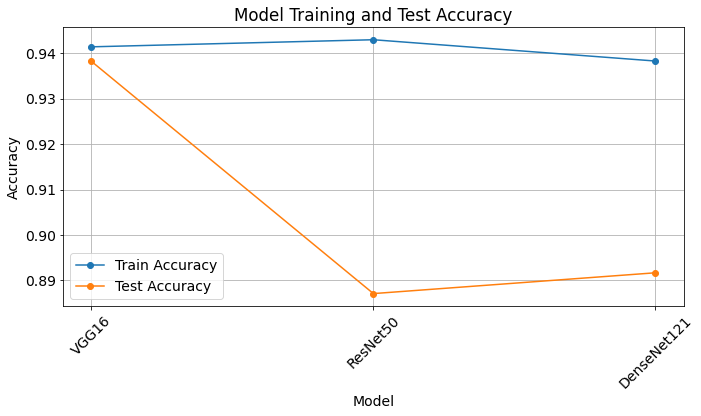

<Figure size 432x288 with 0 Axes>

In [34]:
import matplotlib.pyplot as plt

# Plot the results
plt.figure(figsize=(10, 6))

# Plot training accuracy
plt.plot(results_df['Model'], results_df['Train Accuracy'], marker='o', label='Train Accuracy')

# Plot test accuracy
plt.plot(results_df['Model'], results_df['Test Accuracy'], marker='o', label='Test Accuracy')

# Set labels and title
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Model Training and Test Accuracy')
plt.xticks(rotation=45)
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.savefig('/kaggle/working/model_accuracy_plot.png')
plt.show()
plt.savefig('/kaggle/working/model_accuracy_plot.png')

In [15]:
import tensorflow as tf
print(tf.__version__)


2.4.1


In [13]:
import nibabel as nib
from deepbrain import Extractor

# Load a nifti as 3d numpy image [H, W, D]
img_path="/kaggle/input/nibfiles/image.nii"
img = nib.load(img_path).get_fdata()

ext = Extractor()

# `prob` will be a 3d numpy image containing probability 
# of being brain tissue for each of the voxels in `img`
prob = ext.run(img) 

# mask can be obtained as:
mask = prob > 0.5

AttributeError: module 'tensorflow' has no attribute 'Session'

In [12]:
import numpy as np
import nibabel as nib
from PIL import Image

# Load JPEG image
img_path = "/kaggle/input/braintumor/ff.jpg"
img = Image.open(img_path)
img_array = np.array(img)

# Create a NIfTI image from the JPEG array
nifti_img = nib.Nifti1Image(img_array, np.eye(4))  # Assuming identity affine matrix for simplicity

# Save the NIfTI image
output_nii_path = "/kaggle/working/image.nii.gz"
nib.save(nifti_img, output_nii_path)


In [4]:
pip install nib

     |████████████████████████████████| 62 kB 851 kB/s eta 0:00:01
  Created wheel for nib: filename=Nib-0.5.7-py3-none-any.whl size=34788 sha256=3356304062de56fa1b8063fdfaca1360aa268e6730c1a45de49bb030e5f322a5
  Stored in directory: /root/.cache/pip/wheels/00/c8/fc/b9b09c4f8bf87bbfef04999ef0e93fe0b185515d7723670de2
  Created wheel for sh: filename=sh-1.14.3-py2.py3-none-any.whl size=39655 sha256=84523cd2b206f70c7e7ad3b9b289412864edd960e59c7e5c87097cbdf749d962
  Stored in directory: /root/.cache/pip/wheels/e0/d2/e1/3290bef6382cfc1ec5e659353e5f403fc1eb385ea5f615519a
Successfully built nib sh
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install deepbrain

     |████████████████████████████████| 677 kB 1.4 MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.
